In [1]:
import sys, os
import scanpy as sc
from copy import copy, deepcopy
from tqdm import tqdm

import numpy as np
import pandas as pd
from scipy.ndimage import distance_transform_edt as dt
from skimage import measure
from scipy.stats import *
import phate

import matplotlib.pyplot as plt
from matplotlib import cm, colors
import seaborn as sns
import plotly.express as px

sys.path.append('/stanley/WangLab/Connie/02.TEMPOmap')
from spatial_funcs import *

# Input

In [2]:
# load AnnData
fpath = '/stanley/WangLab/Data/Analyzed/2021-07-16-Rena-Hela-EU'
sample_list = ['1h_labeling', '1h_labeling_1h_wash', '1h_labeling_2h_wash', '1h_labeling_4h_wash', '1h_labeling_6h_wash', '20h_labeling']
adata_all = sc.read_h5ad(os.path.join(fpath, 'output', '2021-10-06-Rena-EU-starmap-cc.h5ad'))
adata_si = sc.read_h5ad(os.path.join(fpath, 'output', '2021-09-24-Rena-EU-starmap-raw-KD-combined.h5ad'))
adata_all.obs['KD_label_combined'] = adata_si.obs['KD_label_combined']

In [3]:
# gene and sample lists
genes = adata_all.var.index
genesToIndex = genes_to_index(genes)
sample_list = ['1h_labeling', '1h_labeling_1h_wash', '1h_labeling_2h_wash', '1h_labeling_4h_wash', '1h_labeling_6h_wash', '20h_labeling']
batchCorr_genes = ['METTL14', 'METTL3', 'YTHDC2', 'YTHDF1', 'YTHDF2', 'YTHDF3'] # for batch correction
starmap_genes = ['METTL14', 'METTL3', 'YTHDC2', 'YTHDF1', 'YTHDF2', 'YTHDF3', 'YTHDC1']

<AxesSubplot:ylabel='n_genes_by_counts'>

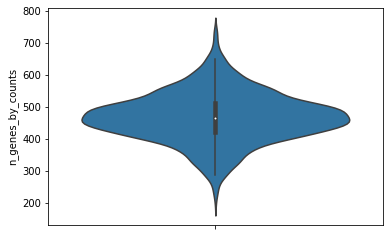

In [4]:
# genes per cell
genesPerCell1h = adata_all.obs[np.logical_and(adata_all.obs['sample']=='1h_labeling', adata_all.obs['KD_label_combined']=='siControl')]['n_genes_by_counts']
sns.violinplot(y=genesPerCell1h)
# plt.savefig('/stanley/WangLab/Connie/02.TEMPOmap/old1000_1h_nGenesPerCell.pdf')

In [5]:
np.mean(genesPerCell1h), np.median(genesPerCell1h)

(468.007400957771, 466.0)

In [6]:
# color code
cc_col = {'G1': '#663399', 'S': '#FFD700', 'G2M': '#66CDAA'}
sam_col = {'1h_labeling': '#9e0142', '1h_labeling_1h_wash': '#f88d52', '1h_labeling_2h_wash': '#ffffbf', '1h_labeling_4h_wash': '#89d0a4', '1h_labeling_6h_wash': '#5e4fa2'}

In [7]:
# kinetic clusters
st1 = pd.read_excel(os.path.join(fpath, 'Supplementary Table 1  V2.xlsx'))
clusters = dict()
clusters[1] = st1[st1['Kinetic cluster']==1]['Gene'].values
clusters[2] = st1[st1['Kinetic cluster']==2]['Gene'].values
clusters[3] = st1[st1['Kinetic cluster']==3]['Gene'].values
clusters[4] = st1[st1['Kinetic cluster']==4]['Gene'].values
clusters[5] = st1[st1['Kinetic cluster']==5]['Gene'].values

# Preprocessing

In [8]:
adata_5sam = separate_adata_by_sample(adata_all, sample_list[:5])
adata_5sam_batch = deepcopy(adata_5sam)
batch_corr = []
for sample in sample_list[:5]:
    sg = adata_5sam_batch.X[np.isin(adata_5sam_batch.obs['sample'], sample), :]
    sg = sg[:,np.isin(adata_5sam_batch.var.index, batchCorr_genes)]
    sg_avg = np.average(sg)
    batch_corr.append(sg_avg)
    adata_5sam_batch.X[np.isin(adata_5sam_batch.obs['sample'], sample)] /= sg_avg

In [9]:
batch_corr

[6.0949492, 6.6069517, 7.1263847, 8.341875, 10.726227]

In [10]:
def adata_remove_genes(adata, genes_to_remove, layers=None):
    var = adata.var.loc[np.isin(adata.var.index, genes_to_remove, invert=True)]
    X = adata.X[:, np.isin(adata.var.index, genes_to_remove, invert=True)]
    adata_new = sc.AnnData(X=X, obs=adata.obs, var=var)
    if layers:
        for layer in layers:
            adata_new.layers[layer] = adata.layers[layer][:, np.isin(adata.var.index, genes_to_remove, invert=True)]
    return adata_new

def adata_remove_cells(adata, cell_label_category, cell_label, layers=None):
    '''remove cells with given label and adjust obs accordingly'''
    obs = adata.obs.loc[np.isin(adata.obs[cell_label_category], cell_label, invert=True)]
    X = adata.X[np.isin(adata.obs[cell_label_category], cell_label, invert=True), :]
    adata_new = sc.AnnData(X=X, obs=obs, var=adata.var)
    if layers:
        for layer in layers:
            adata_new.layers[layer] = adata.layers[layer][np.isin(adata.obs[cell_label_category], cell_label, invert=True), :]
    return adata_new

In [11]:
adata_exp = adata_remove_cells(adata_5sam_batch, 'KD_label_combined', 'siYTHDC1')
adata_exp = adata_remove_genes(adata_exp, starmap_genes)

In [14]:
# adata_exp.write_h5ad('/stanley/WangLab/Connie/02.TEMPOmap/phate/adata_exp.h5ad')

In [18]:
np.unique(adata_exp.obs['sample'])

array(['1h_labeling', '1h_labeling_1h_wash', '1h_labeling_2h_wash',
       '1h_labeling_4h_wash', '1h_labeling_6h_wash'], dtype=object)

In [12]:
# kinetic clusters 
cluster_pct = dict() # --1. genes average expr
cluster_counts = dict() # --2. raw counts
for clu in clusters.keys():
    clusterX = adata_exp[:, clusters[clu]].X
    cluster_sum = np.sum(clusterX, axis=1)
    cluster_counts[clu] = cluster_sum
    cluster_pct[clu] = cluster_sum / np.sum(adata_exp.X, axis=1)

In [21]:
# export for plotting uses
import pickle
# with open('/stanley/WangLab/Connie/02.TEMPOmap/umap/kc_counts.pickle', 'wb') as file:
#     pickle.dump(cluster_counts, file, protocol=pickle.HIGHEST_PROTOCOL)
with open('/stanley/WangLab/Connie/02.TEMPOmap/umap/kc_pct.pickle', 'wb') as file:
    pickle.dump(cluster_pct, file, protocol=pickle.HIGHEST_PROTOCOL)

# Expression Data

### UMAP

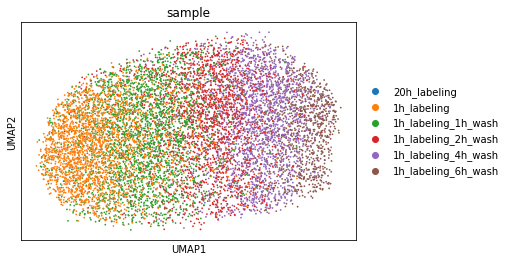

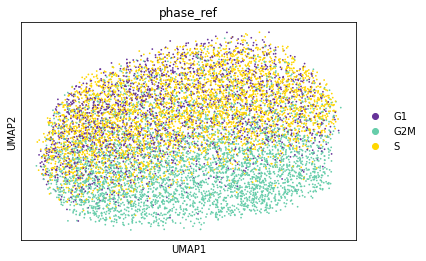

In [20]:
pp_pca_umap(adata_exp, pp=True)
sc.pp.neighbors(adata_exp, metric='euclidean', n_neighbors=15)
sc.tl.umap(adata_exp, min_dist=0.5)
sc.pl.umap(adata_exp, color='sample')
sc.pl.umap(adata_exp, color='phase_ref', palette={'G1': 'rebeccapurple', 'G2M': 'mediumaquamarine', 'S': 'gold'})

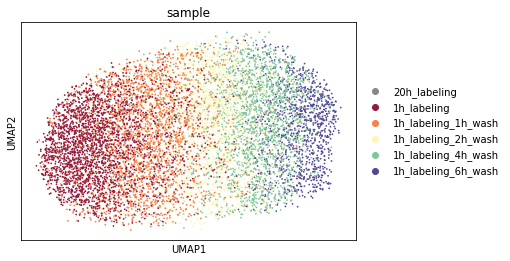

In [13]:
fig = sc.pl.umap(adata_exp, color='sample', show=False, palette={'1h_labeling': '#931A3C', '1h_labeling_1h_wash': '#F5824A', '1h_labeling_2h_wash': '#FCF6B9', '1h_labeling_4h_wash': '#80C699', '1h_labeling_6h_wash': '#554797', '20h_labeling': '#888888'})
# plt.savefig('/')

In [13]:
# adata_exp.write('total_expr.h5ad')

### PHATE

In [21]:
phate_exp = phate.PHATE(n_jobs=1, knn=30, decay=15, t='auto', gamma=1)
Y_phate = phate_exp.fit_transform(adata_exp)
phate_exp.set_params(n_components=3)
Y_phate_3d = phate_exp.transform()

Calculating PHATE...
  Running PHATE on 9833 observations and 991 variables.
  Calculating graph and diffusion operator...
    Calculating PCA...
    Calculated PCA in 0.58 seconds.
    Calculating KNN search...
    Calculated KNN search in 18.96 seconds.
    Calculating affinities...
    Calculated affinities in 39.30 seconds.
  Calculated graph and diffusion operator in 61.04 seconds.
  Calculating landmark operator...
    Calculating SVD...
    Calculated SVD in 38.42 seconds.
    Calculating KMeans...
    Calculated KMeans in 16.10 seconds.
  Calculated landmark operator in 85.72 seconds.
  Calculating optimal t...
    Automatically selected t = 2
  Calculated optimal t in 4.32 seconds.
  Calculating diffusion potential...
  Calculated diffusion potential in 0.29 seconds.
  Calculating metric MDS...
  Calculated metric MDS in 6.18 seconds.
Calculated PHATE in 157.62 seconds.
Calculating metric MDS...
Calculated metric MDS in 62.00 seconds.


In [22]:
df_exp = pd.DataFrame(Y_phate_3d, columns=['x', 'y', 'z'])
df_exp['cell_cycle'] = adata_exp.obs['phase_ref'].values
df_exp['orig_index'] = adata_exp.obs['orig_index'].values
df_exp['sample'] = adata_exp.obs['sample'].values
df_exp

,x,y,z,cell_cycle,orig_index,sample
0,0.024614,0.004329,0.001773,G2M,0,1h_labeling_6h_wash
1,0.016756,0.002213,-0.001263,G1,3,1h_labeling_6h_wash
2,0.014807,0.002201,0.000841,G2M,4,1h_labeling_6h_wash
3,0.024435,0.003406,0.001967,G2M,6,1h_labeling_6h_wash
4,0.017821,0.003178,0.000230,G2M,7,1h_labeling_6h_wash
...,...,...,...,...,...,...
9828,-0.016359,0.003363,-0.000652,S,4237,1h_labeling
9829,-0.004129,0.002478,-0.000042,G2M,4238,1h_labeling
9830,-0.014264,0.002426,-0.000423,S,4242,1h_labeling
9831,-0.018007,0.002428,-0.000363,G1,4245,1h_labeling


In [16]:
# add kinetic cluster gene expr
for clu in clusters.keys():
    df_exp[f'kc{clu}'] = cluster_pct[clu]
    df_exp[f'kc{clu}_ct'] = cluster_counts[clu]
df_exp

NameError: name 'df_exp' is not defined

In [24]:
kc_mean = np.mean(df_exp[['kc1_ct', 'kc2_ct', 'kc3_ct', 'kc4_ct', 'kc5_ct']], axis=0)
kc_mean

kc1_ct    28.807796
kc2_ct    19.055407
kc3_ct    19.385565
kc4_ct    11.150330
kc5_ct    40.312046
dtype: float32

In [26]:
# by cell cycle
fig = px.scatter_3d(df_exp, x='x', y='y', z='z', color='cell_cycle', color_discrete_map=cc_col, opacity=1, template='simple_white', custom_data=['orig_index', 'cell_cycle', 'sample']) #, color_discrete_map=cc_col
fig.update_traces(marker=dict(size=1.5, line=dict(width=0)), hovertemplate="<br>".join([
        "X: %{x}",
        "Y: %{y}",
        "Z: %{z}",
        "ind: %{customdata[0]}",
        "cc: %{customdata[1]}",
        "sam: %{customdata[2]}",
    ]))

In [16]:
# by time-points
fig = px.scatter_3d(df_exp, x='x', y='y', z='z', color='sample', color_discrete_map=sam_col, opacity=1, template='simple_white', custom_data=['orig_index', 'cell_cycle', 'sample']) #, color_discrete_map=cc_col
fig.update_traces(marker=dict(size=1.5, line=dict(width=0)), hovertemplate="<br>".join([
        "X: %{x}",
        "Y: %{y}",
        "Z: %{z}",
        "ind: %{customdata[0]}",
        "cc: %{customdata[1]}",
        "sam: %{customdata[2]}",
    ]))

In [52]:
# by marker genes
fig = px.scatter_3d(df_exp, x='x', y='y', z='z', color='kc1', range_color=(0.1, 0.3),
                    color_continuous_scale='inferno_r', opacity=0.5, template='simple_white') 
fig.update_traces(marker=dict(size=3, line=dict(width=0)))
fig.write_html('/stanley/WangLab/Connie/02.TEMPOmap/phate_markerGeneExpr/kc1_1123.html')

In [33]:
for i, clu in enumerate(clusters.keys()):
    fig = px.scatter_3d(df_exp, x='x', y='y', z='z', color=f'kc{clu}_ct', range_color=(10,70),
                    color_continuous_scale='inferno_r', opacity=0.5, template='simple_white') 
    fig.update_traces(marker=dict(size=3, line=dict(width=0)))
    fig.write_html(f'/stanley/WangLab/Connie/02.TEMPOmap/phate_markerGeneExpr/kc{clu}_rawCounts_10-70.html')

In [34]:
fig